# Crystal Structure Discrimination

In [1]:
%%time

import MDAnalysis as mda
import numpy as np
import plotly.graph_objects as go
import plotly.figure_factory as ff
from ordpy import *
from scipy import stats
from scipy import constants
from plotly.subplots import make_subplots


btin_path = './kumagai/16500MPa/btin/'
btin_system = mda.Universe(btin_path + 'selected_btin.lammpsdump', in_memory=True)

bct5_path = './kumagai/16500MPa/bct5/'
bct5_system = mda.Universe(bct5_path + 'selected_bct5.lammpsdump', in_memory=True)

/opt/conda/lib/python3.9/site-packages/MDAnalysis/topology/LAMMPSParser.py:632: UserWarning: Guessed all Masses to 1.0
  warnings.warn('Guessed all Masses to 1.0')
/opt/conda/lib/python3.9/site-packages/MDAnalysis/core/universe.py:658: UserWarning: Reader has no dt information, set to 1.0 ps
  dt=self.trajectory.ts.dt * step,


CPU times: user 1min 30s, sys: 3.89 s, total: 1min 34s
Wall time: 1min 56s


# Figure 1

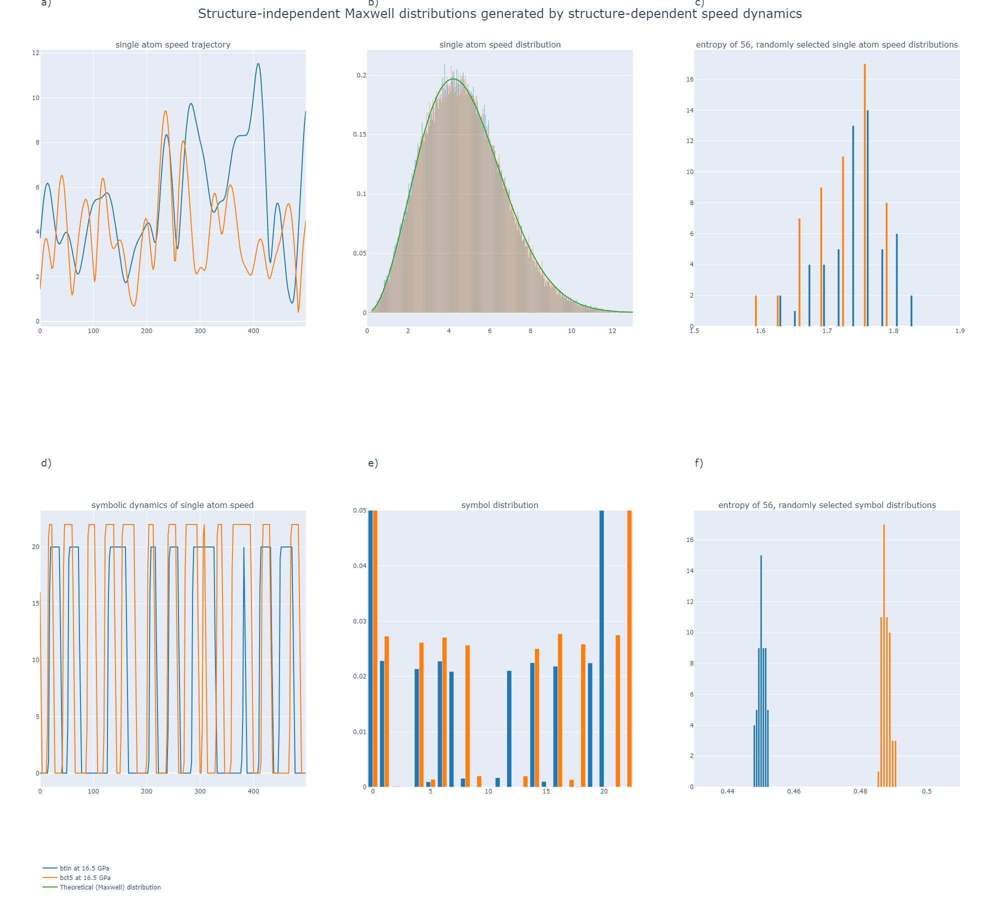

In [56]:
import plotly.express as px

fig_1 = make_subplots(rows=2, cols=3,
                      subplot_titles=("single atom speed trajectory", "single atom speed distribution", "entropy of 56, randomly selected single atom speed distributions", 
                                      "symbolic dynamics of single atom speed", "symbol distribution", "entropy of 56, randomly selected symbol distributions")
                     )

for system, name, color in [(btin_system, "btin at 16.5 GPa", px.colors.qualitative.D3[0]), 
                            (bct5_system, "bct5 at 16.5 GPa", px.colors.qualitative.D3[1])]:

    interval = -100000
    speeds = [[np.linalg.norm(ts.velocities[atom_id].tolist()) for ts in system.trajectory[interval:]] for atom_id in range(len(system.atoms))]

    display_len = 250
    t_n=np.random.choice(len(system.trajectory[interval:]) - display_len)
    random_atom = np.random.choice(len(system.atoms))
    consecutive_speeds = speeds[random_atom][t_n : t_n + display_len]
    timestep = 2 #[fs]
    fig_1.add_trace(go.Scatter(x=[i*timestep for i in range(len(consecutive_speeds))], 
                               y=consecutive_speeds,
                               mode='lines',
                               name=name,
                               line=dict(color=color)
                              ),
                    row=1, col=1)

    dist_plot = ff.create_distplot([speeds[random_atom]], [name], bin_size=0.05, colors=[color])
    fig_1.add_trace(go.Histogram(dist_plot['data'][0], showlegend=False), row=1, col=2)
    
    speeds_entropies = [stats.entropy(np.histogram(s, density=True)[0]) for s in speeds]
    hist, bins = np.histogram(speeds_entropies, bins='auto')
    fig_1.add_trace(go.Bar(x=bins,
                           y=hist,
                           showlegend=False,
                           marker_color=color
                          ),
                   row=1, col=3)
    
    ordpy_dx = 4
    ordinal_patterns, probabilities = ordinal_distribution(speeds[random_atom], dx=ordpy_dx)
    unique_symbols = {repr(symbol.tolist()):idx for symbol, idx in zip(ordinal_patterns, range(len(ordinal_patterns)))}
    fig_1.add_trace(go.Bar(x=[idx for _, idx in unique_symbols.items()],
                           y=[p for p in probabilities.tolist()],
                           marker_color=color,
                           showlegend=False),
                    row=2, col=2)
    
    
    consecutive_speeds = speeds[random_atom][t_n - ordpy_dx + 1: t_n + display_len]    
    symbolic_dynamics = [unique_symbols[repr(symbol.tolist())] for symbol in ordinal_sequence(consecutive_speeds, dx=ordpy_dx)]
    fig_1.add_trace(go.Scatter(x=[i*timestep for i in range(len(symbolic_dynamics))], 
                               y=symbolic_dynamics,
                               mode='lines',
                               name=name,
                               showlegend=False,
                               line=dict(color=color)
                              ),
                    row=2, col=1)
    
    symbols_entropy = [permutation_entropy(s, dx=ordpy_dx) for s in speeds]
    hist, bins = np.histogram(symbols_entropy, bins='auto')
    fig_1.add_trace(go.Bar(x=bins,
                           y=hist,
                           showlegend=False,
                           marker_color=color
                          ),
                   row=2, col=3)
    
#theoretical speeds distribution
k, _, _ = constants.physical_constants['Boltzmann constant']
u_kg, _, _ = constants.physical_constants['atomic mass unit-kilogram relationship']
m = 28.086 # Silicon's mass in atomic mass units
T = 300.0 # MD Temperature
metal_SI = 100.0 # Lammps' metal velocity units to (Angstrem/ps)-SI relationship
theoretical_scale = np.math.sqrt( (T*k)/(m*u_kg) ) / metal_SI
#print(f"{theoretical_scale=}")
x = np.linspace(stats.maxwell.ppf(0.0001, loc=0, scale=theoretical_scale),
                stats.maxwell.ppf(0.9999, loc=0, scale=theoretical_scale), 100)
fig_1.add_trace(go.Scatter(x=x, 
                           y=stats.maxwell.pdf(x, loc=0, scale=theoretical_scale), 
                           mode="lines", 
                           name="Theoretical (Maxwell) distribution",
                           line=dict(color=px.colors.qualitative.D3[2])
                          ),
                row=1, col=2)
    

fig_1.update_xaxes(title_text=r'$time\space[fs]$', row=1, col=1)
fig_1.update_yaxes(title_text=r'$speed\space[\mathring{A}/fs]$', row=1, col=1)

fig_1.update_xaxes(title_text=r'$speed\space[\mathring{A}/fs]$', range=[0, 13.0], row=1, col=2)
fig_1.update_yaxes(title_text=r'$PDF$', row=1, col=2)

fig_1.update_xaxes(title_text=r'$entropy$', range=[1.5, 1.9], row=1, col=3)
fig_1.update_yaxes(title_text=r'$count$', row=1, col=3)

fig_1.update_xaxes(title_text=r'$time\space[fs]$', row=2, col=1)
fig_1.update_yaxes(title_text=r'$symbol \space number$', row=2, col=1)

fig_1.update_xaxes(title_text=r'$symbol \space number$', row=2, col=2)
fig_1.update_yaxes(title_text=r'$PDF$', range=[0.0, 0.05], row=2, col=2)

fig_1.update_xaxes(title_text=r'$entropy$', range=[0.43, 0.51], row=2, col=3)
fig_1.update_yaxes(title_text=r'$count$', row=2, col=3)

fig_1.add_annotation(x=0, y=1.2, xref="x domain", yref="y domain", text="a)", showarrow=False, font=dict(size=20))
fig_1.add_annotation(x=0, y=1.2, xref="x2 domain", yref="y2 domain", text="b)", showarrow=False, font=dict(size=20))
fig_1.add_annotation(x=0, y=1.2, xref="x3 domain", yref="y3 domain", text="c)", showarrow=False, font=dict(size=20))
fig_1.add_annotation(x=0, y=1.2, xref="x4 domain", yref="y4 domain", text="d)", showarrow=False, font=dict(size=20))
fig_1.add_annotation(x=0, y=1.2, xref="x5 domain", yref="y5 domain", text="e)", showarrow=False, font=dict(size=20))
fig_1.add_annotation(x=0, y=1.2, xref="x6 domain", yref="y6 domain", text="f)", showarrow=False, font=dict(size=20))

fig_1.update_layout(height=900,
                    
                    title={'text': "Structure-independent Maxwell distributions generated by structure-dependent speed dynamics",
                           'y':0.99,
                           'x':0.5,
                           'xanchor': 'center',
                           'yanchor': 'top',
                           'font': dict(size=25)
                          },
                    
                    legend=dict(orientation="h"),
                   )

fig_1.show()

In [47]:
dia_path_10GPa = './kumagai/10000MPa/dia/'
dia_system_10GPa = mda.Universe(dia_path_10GPa + 'selected_dia.lammpsdump', in_memory=True)
bct5_path_10GPa = './kumagai/10000MPa/bct5/'
bct5_system_10GPa = mda.Universe(bct5_path_10GPa + 'selected_bct5.lammpsdump', in_memory=True)

btin_path_7GPa = './kumagai/7000MPa/btin/'
btin_system_7GPa = mda.Universe(btin_path_7GPa + 'selected_btin.lammpsdump', in_memory=True)
bc8_path_7GPa = './kumagai/7000MPa/bc8/'
bc8_system_7GPa = mda.Universe(bc8_path_7GPa + 'selected_bc8.lammpsdump', in_memory=True)

/opt/conda/lib/python3.9/site-packages/MDAnalysis/topology/LAMMPSParser.py:632: UserWarning:

Guessed all Masses to 1.0

/opt/conda/lib/python3.9/site-packages/MDAnalysis/core/universe.py:658: UserWarning:

Reader has no dt information, set to 1.0 ps



# Figure 2

In [ ]:
entropies = []
names = []
colors = []

for system, name, color in [(btin_system, "btin at 16.5GPa", px.colors.qualitative.D3[0]), 
                            (bct5_system, "bct5 at 16.5GPa", px.colors.qualitative.D3[1]),
                            (dia_system_10GPa, "dia at 10GPa", px.colors.qualitative.D3[2]),
                            (bct5_system_10GPa, "bct5 at 10GPa", px.colors.qualitative.D3[3]),
                            (btin_system_7GPa, "btin at 7GPa", px.colors.qualitative.D3[4]),
                            (bc8_system_7GPa, "bc8 at 7GPa", px.colors.qualitative.D3[5]),
                           ]:
    
    speeds = [[np.linalg.norm(ts.velocities[atom_id].tolist()) for ts in system.trajectory] for atom_id in range(len(system.atoms))]
    
    for observation_lenght in [-10000]:    
        entropies.append([permutation_entropy(s[observation_lenght:], dx=4) for s in speeds])
        names.append(repr(interval) + name)
        colors.append(color)

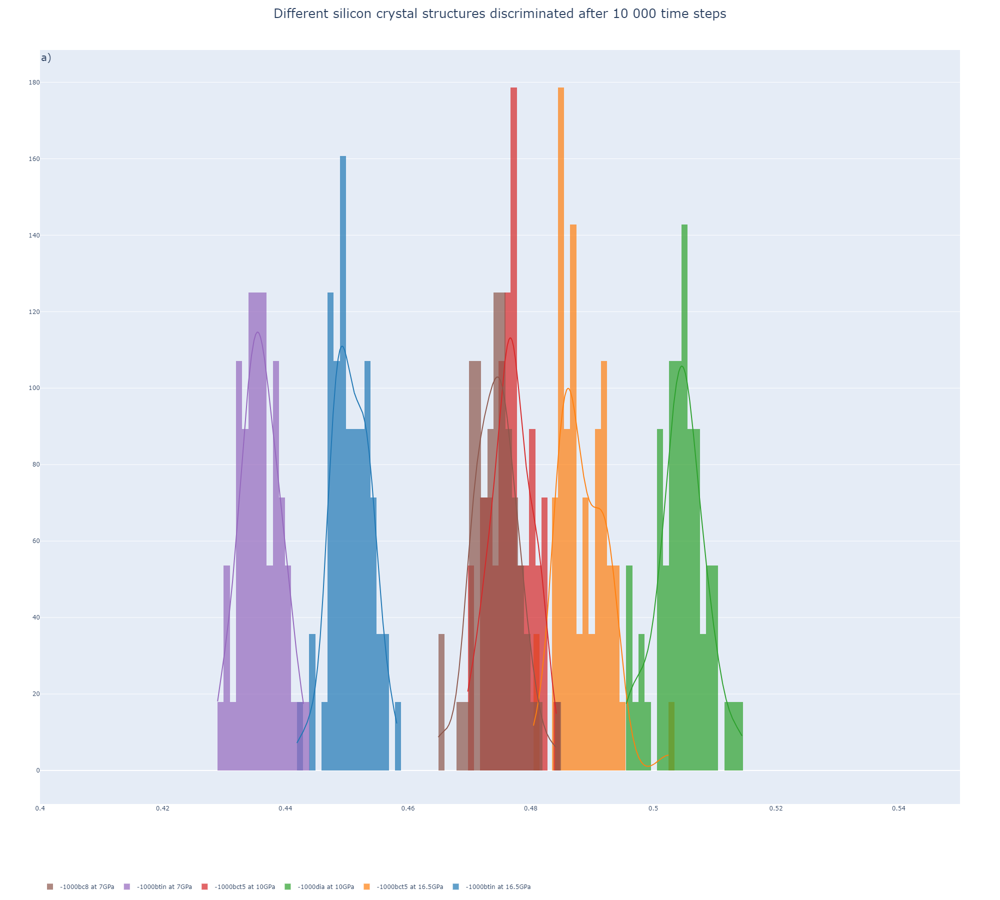

In [70]:
fig_2 = ff.create_distplot(entropies, names, colors=colors, bin_size=.001, show_rug=False)
fig_2.update_xaxes(title_text=r'$entropy$', range=[0.40, 0.55])
fig_2.update_yaxes(title_text=r'$count$')
fig_2.add_annotation(x=0, y=1.0, xref="x domain", yref="y domain", text="a)", showarrow=False, font=dict(size=20))

fig_2.update_layout(height=900,
                    
                    title={'text': "Different silicon crystal structures discriminated after 10 000 time steps",
                           'y':0.99,
                           'x':0.5,
                           'xanchor': 'center',
                           'yanchor': 'top',
                           'font': dict(size=25)
                          },
                    
                    legend=dict(orientation="h"),
                   )
fig_2.show()

In [65]:
entropies_1M_observations = []
names_1M_observations = []
colors_1M_observashow = []

for system, name, color in [(bct5_system_10GPa, "bct5 at 10GPa", px.colors.qualitative.D3[3]),
                            (bc8_system_7GPa, "bc8 at 7GPa", px.colors.qualitative.D3[5]),
                           ]:
    
    speeds = [[np.linalg.norm(ts.velocities[atom_id].tolist()) for ts in system.trajectory] for atom_id in range(len(system.atoms))]
    
    for observation_lenght in [-1000000]:    
        entropies_1M_observations.append([permutation_entropy(s[observation_lenght:], dx=4) for s in speeds])
        names_1M_observations.append(repr(interval) + name)
        colors_1M_observashow.append(color)

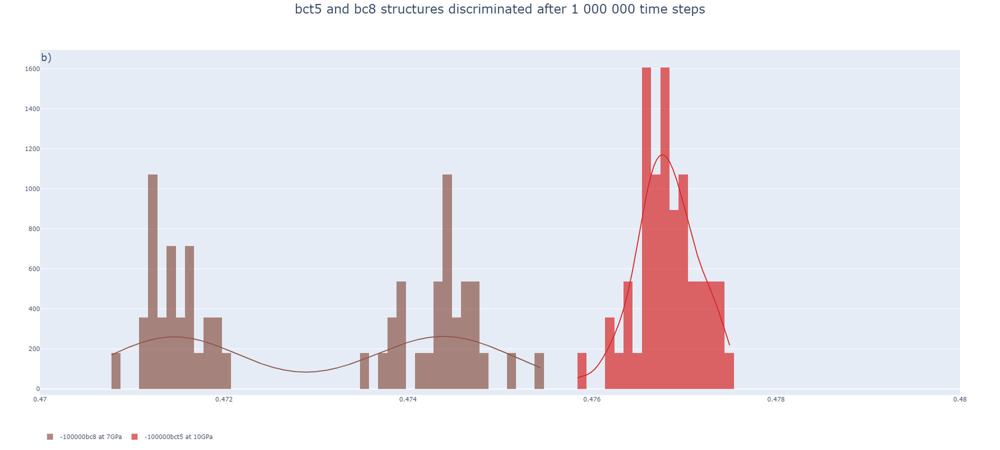

In [72]:
fig_3 = ff.create_distplot(entropies_1M_observations, names_1M_observations, colors=colors_1M_observashow, bin_size=.0001, show_rug=False)
fig_3.update_xaxes(title_text=r'$entropy$', range=[0.47, 0.48])
fig_3.update_yaxes(title_text=r'$count$')
fig_3.add_annotation(x=0, y=1.0, xref="x domain", yref="y domain", text="b)", showarrow=False, font=dict(size=20))

fig_3.update_layout(height=900,
                    
                    title={'text': "bct5 and bc8 structures discriminated after 1 000 000 time steps",
                           'y':0.99,
                           'x':0.5,
                           'xanchor': 'center',
                           'yanchor': 'top',
                           'font': dict(size=25)
                          },
                    
                    legend=dict(orientation="h"),
                   )
fig_3.show()

In [73]:
entropies_1M_observations

[[0.47692259807077875,
  0.47678660440125037,
  0.47680807490083554,
  0.4771612717823172,
  0.47686359392670846,
  0.47584198264765953,
  0.47698286415776364,
  0.47683159490431676,
  0.47702794778548374,
  0.4770273838981748,
  0.4773463201276896,
  0.4774996164469226,
  0.4764430645663531,
  0.4761946405880214,
  0.47680122550473386,
  0.47705954897797853,
  0.4766565402354879,
  0.47697073872857476,
  0.4767587149074886,
  0.47616594366843085,
  0.47689467362429167,
  0.4771720256507256,
  0.4770583888216083,
  0.4763494441413159,
  0.476577998008367,
  0.4765833063642368,
  0.4765893707537295,
  0.47671429906827384,
  0.47641314252671235,
  0.4765948352892404,
  0.4766654024355463,
  0.4768342284873349,
  0.4767986392578992,
  0.4771838305819194,
  0.477027510893852,
  0.47734586730728285,
  0.47690005894419807,
  0.4762856044241793,
  0.4766439270757141,
  0.4768421890925888,
  0.47660310589623656,
  0.47727469012467716,
  0.4766685164868195,
  0.477336281805388,
  0.476431839520